<a href="https://colab.research.google.com/github/Enzo1193/S-S/blob/main/punto_4.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import os
import zipfile
from google.colab import files

# 1. Subir el archivo ZIP
uploaded = files.upload()

# 2. Crear carpeta destino
os.makedirs("results", exist_ok=True)

# 3. Mover el archivo ZIP a la carpeta 'files/'
zip_path = "audios.zip"  # Asegúrate de que el nombre coincide
new_zip_path = os.path.join("results", zip_path)
os.rename(zip_path, new_zip_path)

# 4. Extraer el contenido en 'files/'
with zipfile.ZipFile(new_zip_path, "r") as zip_ref:
    zip_ref.extractall("results/")

print("Archivos extraídos en 'results/'")

Saving audios.zip to audios.zip
Archivos extraídos en 'results/'


In [ ]:
import pandas as pd
from IPython.display import display
from pathlib import Path

# Definir la ruta base de los audios
base_path = Path("results/audios")

# Verificar que la carpeta de audios existe
if not base_path.exists():
    raise FileNotFoundError(f"La carpeta {base_path} no existe. Asegúrate de que los audios fueron extraídos.")

# Diccionario para asignar claves según el nombre de la carpeta
clave_dict = {"Samuel": 1}

# Lista para almacenar los datos
data = []

# Recorrer las carpetas dentro de 'results/audios/'
for folder in base_path.iterdir():
    if folder.is_dir():  # Verificar que sea una carpeta
        for file in folder.glob("*.wav"):  # Filtrar archivos WAV
            clave = clave_dict.get(folder.name, 2)  # Asignar clave usando el diccionario
            data.append([file.name, folder.name, clave])

# Crear y mostrar el DataFrame
df = pd.DataFrame(data, columns=["NOMBRE DEL ARCHIVO", "ESTUDIANTE", "CLAVE"])
display(df)


,NOMBRE DEL ARCHIVO,ESTUDIANTE,CLAVE
0,segment_9.wav,Sebastian,2
1,segment_29.wav,Sebastian,2
2,segment_15.wav,Sebastian,2
3,segment_12.wav,Sebastian,2
4,segment_26.wav,Sebastian,2
...,...,...,...
73,segment_18.wav,Samuel,1
74,segment_8.wav,Samuel,1
75,segment_22.wav,Samuel,1
76,segment_39.wav,Samuel,1


Reproduciendo: segment_10.wav


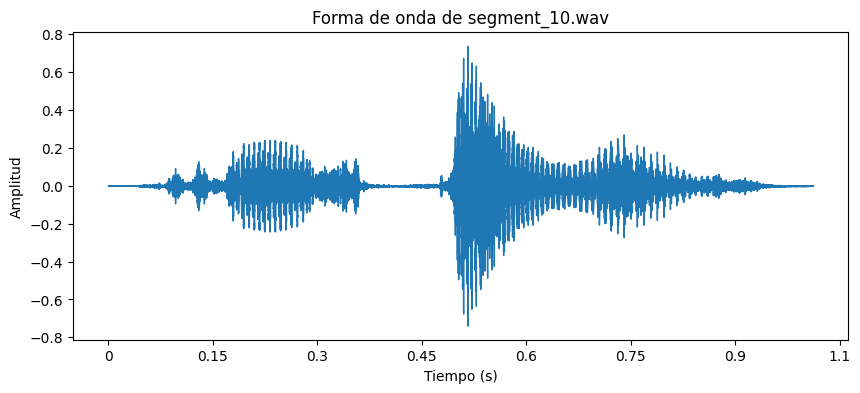

Shape del audio: (48528,)
Frecuencia de muestreo: 48000 Hz


In [ ]:
from pathlib import Path
import librosa
import librosa.display
import matplotlib.pyplot as plt
from IPython.display import Audio

# Definir el archivo de audio a procesar
nombre_audio = "segment_10.wav"
carpeta_audio = "Samuel"

# Construir la ruta completa del audio
audio_path = Path("results/audios") / carpeta_audio / nombre_audio

# Verificar si el archivo existe
if not audio_path.exists():
    raise FileNotFoundError(f"El archivo {audio_path} no fue encontrado.")

# Cargar el audio con librosa
y, sr = librosa.load(audio_path, sr=None)  # Carga con la frecuencia original

# Reproducir el audio en Colab
print(f"Reproduciendo: {nombre_audio}")
display(Audio(audio_path, rate=sr))

# Visualización de la forma de onda
plt.figure(figsize=(10, 4))
librosa.display.waveshow(y, sr=sr)
plt.title(f"Forma de onda de {nombre_audio}")
plt.xlabel("Tiempo (s)")
plt.ylabel("Amplitud")
plt.show()

# Mostrar información del audio
print(f"Shape del audio: {y.shape}")
print(f"Frecuencia de muestreo: {sr} Hz")


In [ ]:
df.shape

(78, 3)

In [ ]:
from pathlib import Path
import librosa
import soundfile as sf
import numpy as np
import IPython.display as ipd
from tqdm import tqdm  # Para visualizar el progreso

# Ruta base de los audios y carpeta de salida
base_path = Path("results/audios")
output_folder = Path("results/audios_recortados")
output_folder.mkdir(parents=True, exist_ok=True)  # Crear carpeta si no existe

# Duración deseada en segundos
duracion_deseada = 1.0

# Lista para guardar los archivos recortados
audios_recortados = []

# Recorrer todas las carpetas dentro de 'results/audios/'
for folder in base_path.iterdir():
    if folder.is_dir():  # Verificar que sea una carpeta
        output_subfolder = output_folder / folder.name
        output_subfolder.mkdir(exist_ok=True)  # Crear subcarpeta si no existe

        # Procesar archivos .wav
        for file in tqdm(folder.glob("*.wav"), desc=f"Procesando {folder.name}"):
            # Cargar el audio con su frecuencia original
            y, sr = librosa.load(file, sr=None)

            # Convertir la duración deseada en muestras
            muestras_deseadas = int(duracion_deseada * sr)

            # Recortar o rellenar con ceros si es necesario
            y = y[:muestras_deseadas] if len(y) > muestras_deseadas else np.pad(y, (0, muestras_deseadas - len(y)))

            # Guardar el audio recortado
            output_path = output_subfolder / file.name
            sf.write(output_path, y, sr)
            audios_recortados.append(output_path)

print("✅ Recorte de audios completado a 1 segundo exacto.")

# Reproducir los audios recortados
for audio_path in audios_recortados:
    print(f"🎵 Reproduciendo: {audio_path}")
    display(ipd.Audio(str(audio_path), rate=sr))


Procesando Sebastian: 39it [00:00, 163.70it/s]
Procesando Samuel: 39it [00:00, 172.93it/s]

✅ Recorte de audios completado a 1 segundo exacto.
🎵 Reproduciendo: results/audios_recortados/Sebastian/segment_9.wav


🎵 Reproduciendo: results/audios_recortados/Sebastian/segment_29.wav


🎵 Reproduciendo: results/audios_recortados/Sebastian/segment_15.wav


🎵 Reproduciendo: results/audios_recortados/Sebastian/segment_12.wav


🎵 Reproduciendo: results/audios_recortados/Sebastian/segment_26.wav


🎵 Reproduciendo: results/audios_recortados/Sebastian/segment_2.wav


🎵 Reproduciendo: results/audios_recortados/Sebastian/segment_1.wav


🎵 Reproduciendo: results/audios_recortados/Sebastian/segment_6.wav


🎵 Reproduciendo: results/audios_recortados/Sebastian/segment_24.wav


🎵 Reproduciendo: results/audios_recortados/Sebastian/segment_27.wav


🎵 Reproduciendo: results/audios_recortados/Sebastian/segment_4.wav


🎵 Reproduciendo: results/audios_recortados/Sebastian/segment_3.wav


🎵 Reproduciendo: results/audios_recortados/Sebastian/segment_30.wav


🎵 Reproduciendo: results/audios_recortados/Sebastian/segment_19.wav


🎵 Reproduciendo: results/audios_recortados/Sebastian/segment_23.wav


🎵 Reproduciendo: results/audios_recortados/Sebastian/segment_35.wav


🎵 Reproduciendo: results/audios_recortados/Sebastian/segment_28.wav


🎵 Reproduciendo: results/audios_recortados/Sebastian/segment_13.wav


🎵 Reproduciendo: results/audios_recortados/Sebastian/segment_10.wav


🎵 Reproduciendo: results/audios_recortados/Sebastian/segment_16.wav


🎵 Reproduciendo: results/audios_recortados/Sebastian/segment_38.wav


🎵 Reproduciendo: results/audios_recortados/Sebastian/segment_14.wav


🎵 Reproduciendo: results/audios_recortados/Sebastian/segment_17.wav


🎵 Reproduciendo: results/audios_recortados/Sebastian/segment_20.wav


🎵 Reproduciendo: results/audios_recortados/Sebastian/segment_31.wav


🎵 Reproduciendo: results/audios_recortados/Sebastian/segment_5.wav


🎵 Reproduciendo: results/audios_recortados/Sebastian/segment_34.wav


🎵 Reproduciendo: results/audios_recortados/Sebastian/segment_37.wav


🎵 Reproduciendo: results/audios_recortados/Sebastian/segment_32.wav


🎵 Reproduciendo: results/audios_recortados/Sebastian/segment_25.wav


🎵 Reproduciendo: results/audios_recortados/Sebastian/segment_7.wav


🎵 Reproduciendo: results/audios_recortados/Sebastian/segment_33.wav


🎵 Reproduciendo: results/audios_recortados/Sebastian/segment_36.wav


🎵 Reproduciendo: results/audios_recortados/Sebastian/segment_21.wav


🎵 Reproduciendo: results/audios_recortados/Sebastian/segment_18.wav


🎵 Reproduciendo: results/audios_recortados/Sebastian/segment_8.wav


🎵 Reproduciendo: results/audios_recortados/Sebastian/segment_22.wav


🎵 Reproduciendo: results/audios_recortados/Sebastian/segment_39.wav


🎵 Reproduciendo: results/audios_recortados/Sebastian/segment_11.wav


🎵 Reproduciendo: results/audios_recortados/Samuel/segment_9.wav


🎵 Reproduciendo: results/audios_recortados/Samuel/segment_29.wav


🎵 Reproduciendo: results/audios_recortados/Samuel/segment_15.wav


🎵 Reproduciendo: results/audios_recortados/Samuel/segment_12.wav


🎵 Reproduciendo: results/audios_recortados/Samuel/segment_26.wav


🎵 Reproduciendo: results/audios_recortados/Samuel/segment_2.wav


🎵 Reproduciendo: results/audios_recortados/Samuel/segment_1.wav


🎵 Reproduciendo: results/audios_recortados/Samuel/segment_6.wav


🎵 Reproduciendo: results/audios_recortados/Samuel/segment_24.wav


🎵 Reproduciendo: results/audios_recortados/Samuel/segment_27.wav


🎵 Reproduciendo: results/audios_recortados/Samuel/segment_4.wav


🎵 Reproduciendo: results/audios_recortados/Samuel/segment_3.wav


🎵 Reproduciendo: results/audios_recortados/Samuel/segment_30.wav


🎵 Reproduciendo: results/audios_recortados/Samuel/segment_19.wav


🎵 Reproduciendo: results/audios_recortados/Samuel/segment_23.wav


🎵 Reproduciendo: results/audios_recortados/Samuel/segment_35.wav


🎵 Reproduciendo: results/audios_recortados/Samuel/segment_28.wav


🎵 Reproduciendo: results/audios_recortados/Samuel/segment_13.wav


🎵 Reproduciendo: results/audios_recortados/Samuel/segment_10.wav


🎵 Reproduciendo: results/audios_recortados/Samuel/segment_16.wav


🎵 Reproduciendo: results/audios_recortados/Samuel/segment_38.wav


🎵 Reproduciendo: results/audios_recortados/Samuel/segment_14.wav


🎵 Reproduciendo: results/audios_recortados/Samuel/segment_17.wav


🎵 Reproduciendo: results/audios_recortados/Samuel/segment_20.wav


🎵 Reproduciendo: results/audios_recortados/Samuel/segment_31.wav


🎵 Reproduciendo: results/audios_recortados/Samuel/segment_5.wav


🎵 Reproduciendo: results/audios_recortados/Samuel/segment_34.wav


🎵 Reproduciendo: results/audios_recortados/Samuel/segment_37.wav


🎵 Reproduciendo: results/audios_recortados/Samuel/segment_32.wav


🎵 Reproduciendo: results/audios_recortados/Samuel/segment_25.wav


🎵 Reproduciendo: results/audios_recortados/Samuel/segment_7.wav


🎵 Reproduciendo: results/audios_recortados/Samuel/segment_33.wav


🎵 Reproduciendo: results/audios_recortados/Samuel/segment_36.wav


🎵 Reproduciendo: results/audios_recortados/Samuel/segment_21.wav


🎵 Reproduciendo: results/audios_recortados/Samuel/segment_18.wav


🎵 Reproduciendo: results/audios_recortados/Samuel/segment_8.wav


🎵 Reproduciendo: results/audios_recortados/Samuel/segment_22.wav


🎵 Reproduciendo: results/audios_recortados/Samuel/segment_39.wav


🎵 Reproduciendo: results/audios_recortados/Samuel/segment_11.wav


In [17]:
from pathlib import Path
import numpy as np
import soundfile as sf
from tqdm import tqdm  # Para visualizar el progreso

# Ruta de los audios recortados
base_path = Path("results/audios_recortados/")

# Definir estudiantes y etiquetas
estudiantes = {"Samuel": 1, "Sebastian": 2}

# Listas para archivos y etiquetas
wav_files = []
labels = []

# Recorrer carpetas y almacenar archivos
for folder, label in estudiantes.items():
    folder_path = base_path / folder
    if folder_path.is_dir():
        for file in folder_path.glob("*.wav"):
            wav_files.append(file)
            labels.append(label)

# Parámetros de segmentación
ts = 1  # Duración en segundos
fs = 48000  # Frecuencia de muestreo (se ajustará dinámicamente)
Ns = len(wav_files)  # Cantidad total de audios

# Inicializar matrices de audio y etiquetas
x_t = np.zeros((Ns, fs))  # Matriz de audios
label_array = np.array(labels).reshape(Ns, 1)  # Vector de etiquetas
name_c = []

# Procesar audios
for idx, file_path in tqdm(enumerate(wav_files), total=Ns, desc="Procesando audios"):
    x, sr = sf.read(file_path)

    # Ajustar frecuencia de muestreo en base al primer archivo
    if idx == 0:
        fs = sr  # Usar la frecuencia original
        x_t = np.zeros((Ns, fs))  # Ajustar matriz de audios

    # Convertir a mono si es necesario
    x = x[:, 0] if x.ndim > 1 else x

    # Ajustar tamaño del audio
    x_t[idx, :len(x)] = x[:fs] if len(x) > fs else np.pad(x, (0, fs - len(x)))

    name_c.append(file_path.name)
    print(f"{idx}: {file_path.name} → Etiqueta {label_array[idx][0]}")

print("✅ Vector de audios y etiquetas creado correctamente.")


Procesando audios:  77%|███████▋  | 60/78 [00:00<00:00, 299.22it/s]

0: segment_9.wav → Etiqueta 1
1: segment_29.wav → Etiqueta 1
2: segment_15.wav → Etiqueta 1
3: segment_12.wav → Etiqueta 1
4: segment_26.wav → Etiqueta 1
5: segment_2.wav → Etiqueta 1
6: segment_1.wav → Etiqueta 1
7: segment_6.wav → Etiqueta 1
8: segment_24.wav → Etiqueta 1
9: segment_27.wav → Etiqueta 1
10: segment_4.wav → Etiqueta 1
11: segment_3.wav → Etiqueta 1
12: segment_30.wav → Etiqueta 1
13: segment_19.wav → Etiqueta 1
14: segment_23.wav → Etiqueta 1
15: segment_35.wav → Etiqueta 1
16: segment_28.wav → Etiqueta 1
17: segment_13.wav → Etiqueta 1
18: segment_10.wav → Etiqueta 1
19: segment_16.wav → Etiqueta 1
20: segment_38.wav → Etiqueta 1
21: segment_14.wav → Etiqueta 1
22: segment_17.wav → Etiqueta 1
23: segment_20.wav → Etiqueta 1
24: segment_31.wav → Etiqueta 1
25: segment_5.wav → Etiqueta 1
26: segment_34.wav → Etiqueta 1
27: segment_37.wav → Etiqueta 1
28: segment_32.wav → Etiqueta 1
29: segment_25.wav → Etiqueta 1
30: segment_7.wav → Etiqueta 1
31: segment_33.wav → Etiqu

Procesando audios: 100%|██████████| 78/78 [00:00<00:00, 334.32it/s]

66: segment_37.wav → Etiqueta 2
67: segment_32.wav → Etiqueta 2
68: segment_25.wav → Etiqueta 2
69: segment_7.wav → Etiqueta 2
70: segment_33.wav → Etiqueta 2
71: segment_36.wav → Etiqueta 2
72: segment_21.wav → Etiqueta 2
73: segment_18.wav → Etiqueta 2
74: segment_8.wav → Etiqueta 2
75: segment_22.wav → Etiqueta 2
76: segment_39.wav → Etiqueta 2
77: segment_11.wav → Etiqueta 2
✅ Vector de audios y etiquetas creado correctamente.


In [18]:
from IPython.display import Audio #reproducir segmento
i = 39
Audio(x_t[i].T,rate=fs)

In [19]:
# Cálculo del vector de frecuencias
vf = np.fft.rfftfreq(x_t.shape[1], d=1/fs)  # d representa el paso temporal (1/fs)

# Cálculo de la FFT real en cada audio
Xw = np.fft.rfft(x_t, axis=1)

# Imprimir dimensiones de la matriz resultante
print(f"Dimensión de Xw: {Xw.shape} (N_ audios, N_frecuencias)")


Dimensión de Xw: (78, 24001) (N_ audios, N_frecuencias)


In [20]:
# Obtener la magnitud del espectro
Xw_mag = np.abs(Xw)

# Encontrar el índice de la frecuencia máxima por cada audio
idx_max_freq = np.argmax(Xw_mag, axis=1)

# Convertir índices a frecuencias
f_max = vf[idx_max_freq]

# Verificar si hay audios sin frecuencia dominante
if len(f_max) > 0:
    print(f"Frecuencia máxima promedio: {np.mean(f_max):.2f} Hz")
    print(f"Frecuencia máxima global: {np.max(f_max):.2f} Hz")
else:
    print("⚠️ No se encontraron frecuencias máximas.")


Frecuencia máxima promedio: 211.94 Hz
Frecuencia máxima global: 1603.00 Hz


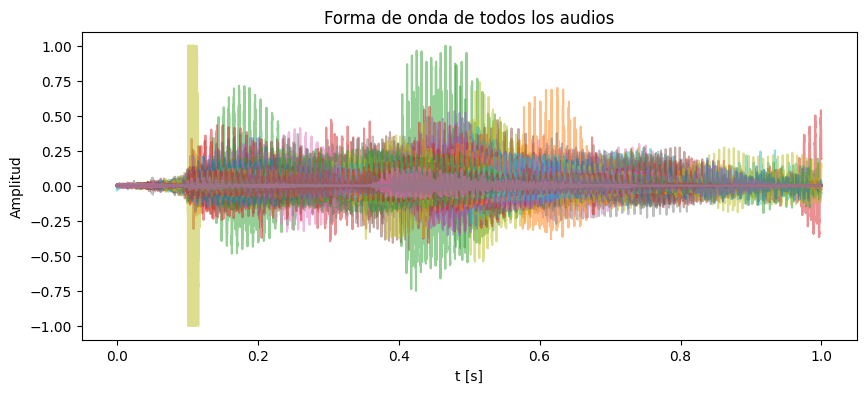

In [21]:
plt.figure(figsize=(10, 4))
for i in range(Ns):
    plt.plot(np.linspace(0, ts, x_t.shape[1]), x_t[i], alpha=0.5)  # Agregar transparencia para visualización
plt.xlabel("t [s]")
plt.ylabel("Amplitud")
plt.title("Forma de onda de todos los audios")
plt.show()

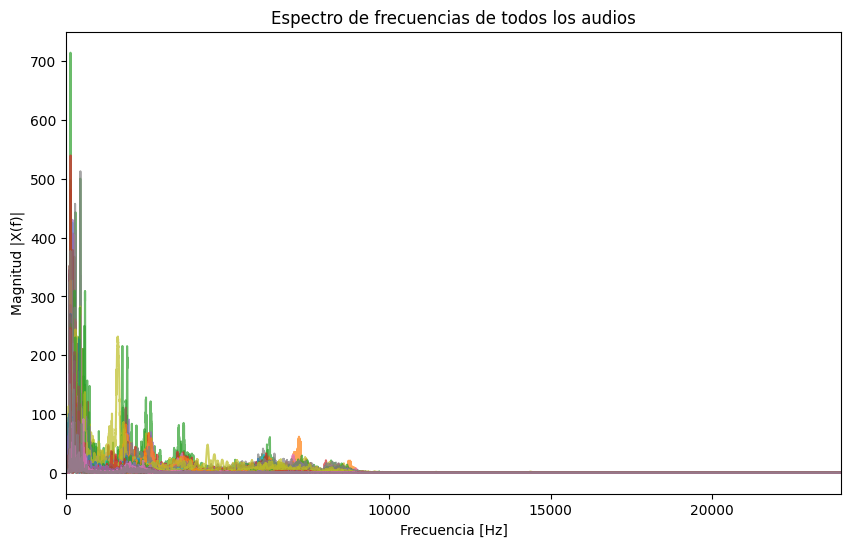

In [22]:
# Graficar el espectro de frecuencias para todos los audios
plt.figure(figsize=(10, 6))
for i in range(Ns):
    plt.plot(vf, abs(Xw[i]), alpha=0.7)

plt.xlabel('Frecuencia [Hz]')
plt.ylabel('Magnitud |X(f)|')
plt.title('Espectro de frecuencias de todos los audios')
plt.xlim(0, fs / 2)  # Limitar a la mitad de la frecuencia de muestreo
plt.show()


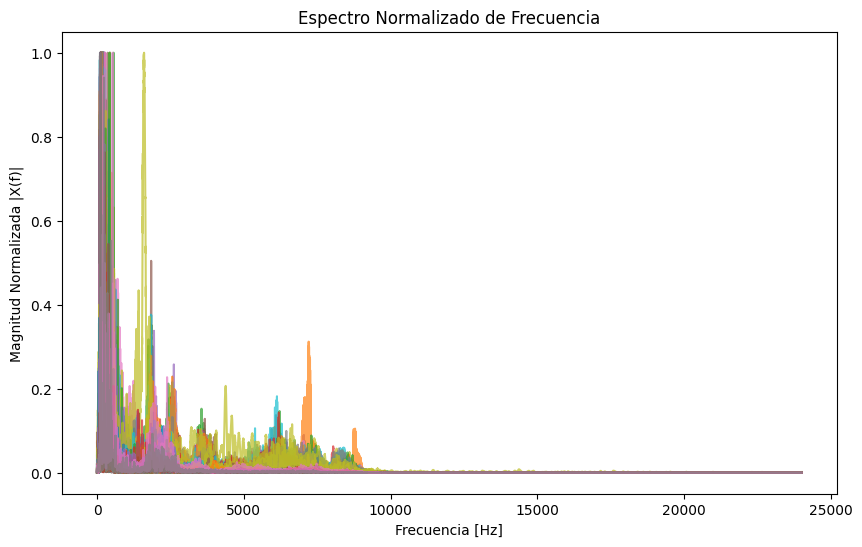

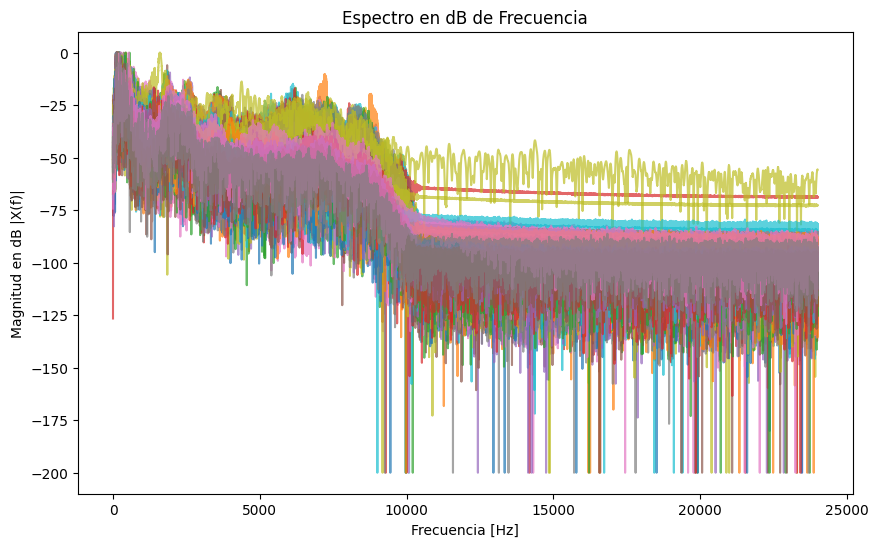

In [23]:
from sklearn.preprocessing import MinMaxScaler

# Normalización de los espectros entre 0 y 1
sca = MinMaxScaler()
Xw_ = sca.fit_transform(np.abs(Xw).T).T

# Graficar el espectro normalizado
plt.figure(figsize=(10, 6))
for i in range(Ns):
    plt.plot(vf, Xw_[i], alpha=0.7)
plt.xlabel('Frecuencia [Hz]')
plt.ylabel('Magnitud Normalizada |X(f)|')
plt.title('Espectro Normalizado de Frecuencia')
plt.show()

# Graficar el espectro en dB
plt.figure(figsize=(10, 6))
for i in range(Ns):
    plt.plot(vf, 20 * np.log10(Xw_[i] + 1e-10), alpha=0.7)  # Colores graduales
plt.xlabel('Frecuencia [Hz]')
plt.ylabel('Magnitud en dB |X(f)|')
plt.title('Espectro en dB de Frecuencia')
plt.show()


In [24]:
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
#visualización de datos
red_ = TSNE(perplexity = 20,n_components=2,random_state=123,learning_rate='auto',init='pca')
#red_ = PCA(n_components=2,random_state=123)
fmax = 24001
X_2D = red_.fit_transform(Xw_[:,:fmax]) #se tiene en cuenta el espectro hasta fmax Hz
label = label_array.flatten()

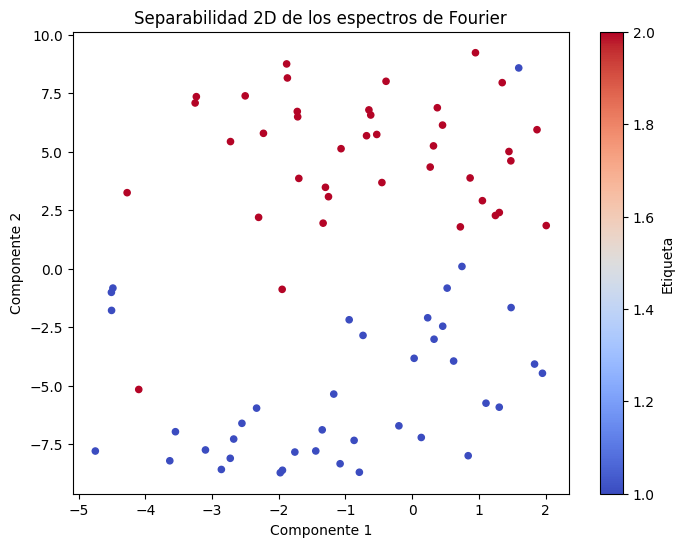

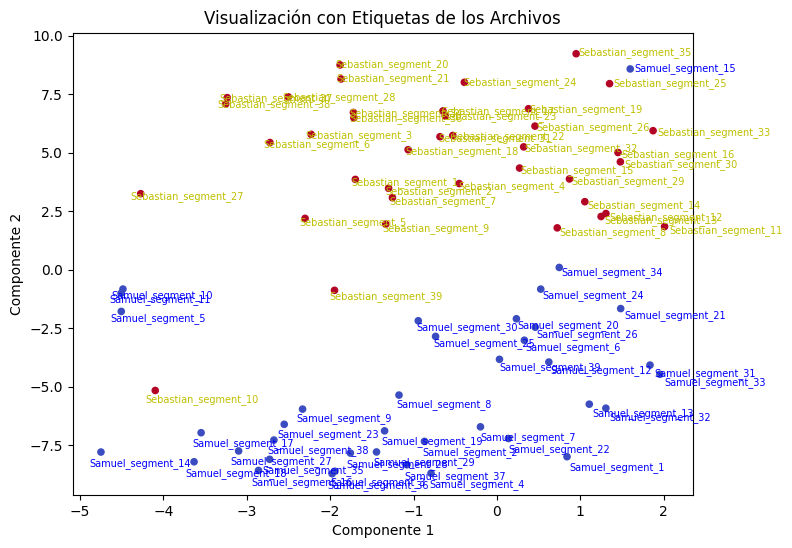

In [25]:
# Gráfico de dispersión 2D
plt.figure(figsize=(8, 6))
plt.scatter(X_2D[:, 0], X_2D[:, 1], c=label, s=20, cmap='coolwarm')  # Cambié el tamaño y el colormap
plt.colorbar(label='Etiqueta')
plt.xlabel('Componente 1')
plt.ylabel('Componente 2')
plt.title('Separabilidad 2D de los espectros de Fourier')
plt.show()

# Agregar los nombres de los archivos con un pequeño desplazamiento
color_ = ["b", "y"]  # Azul para Samuel, Amarillo para Sebastián

plt.figure(figsize=(8, 6))
plt.scatter(X_2D[:, 0], X_2D[:, 1], c=label, s=20, cmap='coolwarm')

for i, tex in enumerate(name_c):
    nombre = tex[:-4]  # Eliminar la extensión ".wav"
    estudiante = "Samuel" if label[i] == 1 else "Sebastian"
    plt.text(X_2D[i, 0] * 1.03, X_2D[i, 1] * 1.03, f"{estudiante}_{nombre}",
             fontsize=7, color=color_[int(label[i] - 1)], ha='left', va='top')

plt.xlabel('Componente 1')
plt.ylabel('Componente 2')
plt.title('Visualización con Etiquetas de los Archivos')
plt.show()

In [26]:
num_puntos = X_2D.shape[0]
print(f"Total de puntos en la gráfica: {num_puntos}")


Total de puntos en la gráfica: 78


Saving Rechazado.waptt.opus to Rechazado.waptt.opus
Reproduciendo: Rechazado.waptt.opus


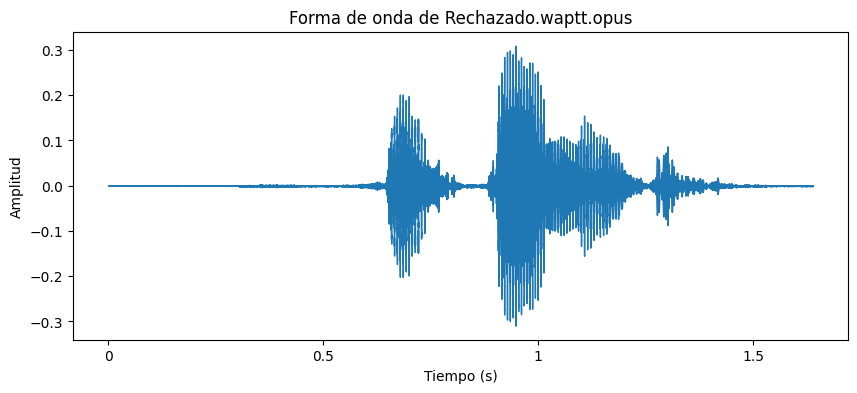

Shape del audio: (26205,)
Frecuencia de muestreo: 16000 Hz


In [32]:
import os
import librosa
import librosa.display
import matplotlib.pyplot as plt
from google.colab import files
from IPython.display import Audio

# 1. Subir el archivo de audio
uploaded = files.upload()

# 2. Obtener el nombre del archivo subido
nuevo_audio = list(uploaded.keys())[0]  # Obtener el nombre del primer archivo subido

# 3. Cargar el audio
y, sr = librosa.load(nuevo_audio, sr=None)  # Cargar con la frecuencia de muestreo original

# 4. Reproducir el audio
print(f"Reproduciendo: {nuevo_audio}")
display(Audio(nuevo_audio, rate=sr))

# 5. Mostrar la forma de onda
plt.figure(figsize=(10, 4))
librosa.display.waveshow(y, sr=sr)
plt.title(f"Forma de onda de {nuevo_audio}")
plt.xlabel("Tiempo (s)")
plt.ylabel("Amplitud")
plt.show()

# 6. Mostrar el array de audio (shape)
print(f"Shape del audio: {y.shape}")
print(f"Frecuencia de muestreo: {sr} Hz")


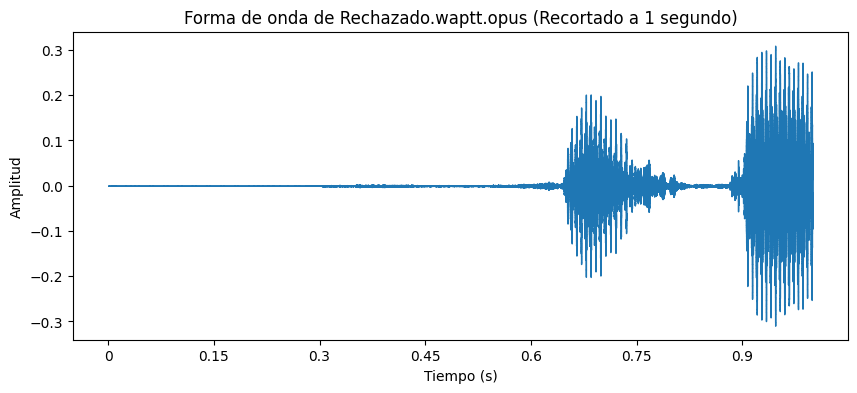

Shape del audio recortado: (16000,)


In [33]:
# 1. Definir la duración deseada en segundos
duracion_deseada = 1.0  # 1 segundo

# 2. Convertir la duración deseada en muestras
muestras_deseadas = int(duracion_deseada * sr)

# 3. Recortar o rellenar con ceros si es necesario
if len(y) > muestras_deseadas:
    y = y[:muestras_deseadas]  # Recortar
elif len(y) < muestras_deseadas:
    y = np.pad(y, (0, muestras_deseadas - len(y)))  # Rellenar con ceros

# 4. Graficar el audio recortado
plt.figure(figsize=(10, 4))
librosa.display.waveshow(y, sr=sr)
plt.title(f"Forma de onda de {nuevo_audio} (Recortado a 1 segundo)")
plt.xlabel("Tiempo (s)")
plt.ylabel("Amplitud")
plt.show()

# Mostrar la nueva longitud del audio recortado
print(f"Shape del audio recortado: {y.shape}")


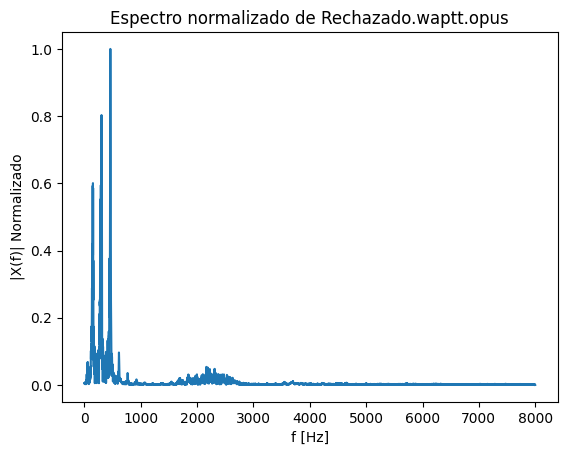

Espectro normalizado (primeros 10 valores): [0.0048656  0.00341011 0.00340339 0.00326594 0.00555904 0.00621171
 0.00517087 0.00362786 0.00325498 0.00494588]


In [34]:
from sklearn.preprocessing import MinMaxScaler

# 1. Calcular la transformada rápida de Fourier (RFFT)
Xw_nuevo = np.fft.rfft(y)  # RFFT de la señal recortada

# 2. Obtener la magnitud del espectro
Xw_mag_nuevo = np.abs(Xw_nuevo)

# 3. Normalizar el espectro entre 0 y 1
sca = MinMaxScaler()
Xw_nuevo_normalizado = sca.fit_transform(Xw_mag_nuevo.reshape(-1, 1)).flatten()  # Normalización

# 4. Graficar el espectro normalizado
vf_nuevo = np.fft.rfftfreq(len(y), 1/sr)  # Frecuencias correspondientes a la RFFT

plt.plot(vf_nuevo, Xw_nuevo_normalizado)
plt.xlabel('f [Hz]')
plt.ylabel('|X(f)| Normalizado')
plt.title(f"Espectro normalizado de {nuevo_audio}")
plt.show()

# Mostrar el espectro normalizado
print("Espectro normalizado (primeros 10 valores):", Xw_nuevo_normalizado[:10])


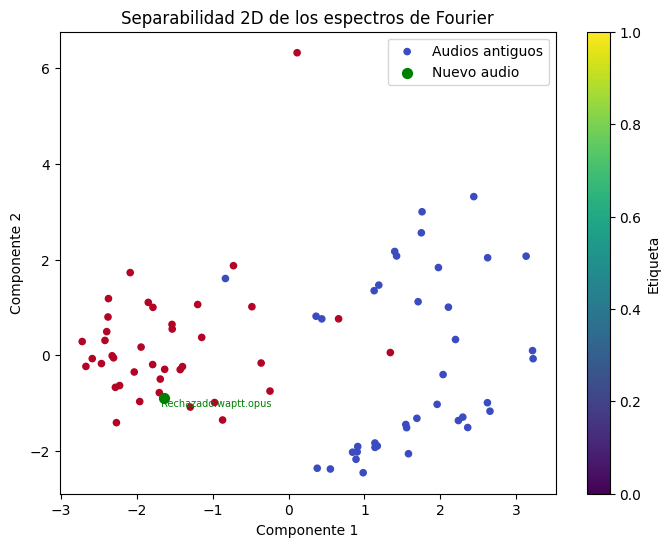

In [35]:
# Determinar el número máximo de puntos en el espectro (24001)
max_len = Xw_.shape[1]

# Ajustar la longitud del espectro del nuevo audio para que coincida con los antiguos
Xw_nuevo_normalizado_resized = np.pad(Xw_nuevo_normalizado[:fmax], (0, max_len - Xw_nuevo_normalizado[:fmax].shape[0]), mode='constant')

# Concatenar todos los espectros de Fourier antiguos con el nuevo audio ajustado
X_combined = np.concatenate([Xw_, Xw_nuevo_normalizado_resized.reshape(1, -1)], axis=0)

# Concatenar todas las etiquetas de los audios antiguos con la etiqueta del nuevo audio
label_combined = np.concatenate([label_array.flatten(), np.array([2])])  # Suponiendo que el nuevo audio es de "Sebastian" (etiqueta 2)

# Usar PCA para reducir la dimensión
red_ = PCA(n_components=2, random_state=123)
X_2D_combined = red_.fit_transform(X_combined)

# Visualización en 2D
plt.figure(figsize=(8, 6))

# Graficar los audios antiguos
plt.scatter(X_2D_combined[:-1, 0], X_2D_combined[:-1, 1], c=label_combined[:-1], s=20, cmap='coolwarm', label='Audios antiguos')

# Graficar el nuevo audio
plt.scatter(X_2D_combined[-1, 0], X_2D_combined[-1, 1], c='g', s=50, label='Nuevo audio')  # Usar color verde para el nuevo audio

# Añadir texto con el nombre del nuevo archivo
plt.text(X_2D_combined[-1, 0] * 1.03, X_2D_combined[-1, 1] * 1.03, f"{nuevo_audio}", fontsize=7, color='g', ha='left', va='top')

# Mostrar colorbar y etiquetas
plt.colorbar(label='Etiqueta')
plt.xlabel('Componente 1')
plt.ylabel('Componente 2')
plt.title('Separabilidad 2D de los espectros de Fourier')
plt.legend()
plt.show()



In [36]:
from scipy.spatial.distance import cdist
import numpy as np

# Extraer las representaciones 2D de los audios antiguos (sin incluir el nuevo audio)
X_old = X_2D_combined[:-1]  # Todos los puntos menos el último
labels_old = label_combined[:-1]  # Etiquetas de los audios antiguos

# Obtener las coordenadas 2D del nuevo audio
X_new = X_2D_combined[-1].reshape(1, -1)  # El nuevo audio es el último punto

# Calcular las distancias entre el nuevo audio y todos los anteriores
distances = cdist(X_new, X_old, metric='euclidean')  # Usamos la distancia euclidiana

# Encontrar el índice de la distancia mínima
index_closer = np.argmin(distances)  # Índice del audio más cercano

# Obtener la etiqueta del audio más cercano
closest_label = labels_old[index_closer]

# Definir un umbral de distancia para aceptación
umbral_distancia = 0.27
 # Ajusta este valor según tus necesidades

# Verificar si el nuevo audio está más cerca del grupo con etiqueta 1 y si la distancia es menor que el umbral
if closest_label == 1 and distances[0, index_closer] < umbral_distancia:
    print("✅ Audio ACEPTADO")
else:
    print("❌ Audio RECHAZADO")


❌ Audio RECHAZADO
